In [8]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_auc_score
from sklearn.metrics import mean_absolute_error,mean_squared_error,make_scorer
from sklearn.metrics import accuracy_score, precision_score, recall_score
from pandas_profiling import ProfileReport
import warnings
warnings.filterwarnings('ignore')
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

In [2]:
df = pd.read_csv("datasets/Bankruptcy_data_Final.csv")

In [3]:
df.head()

,Data Year - Fiscal,Tobin's Q,EPS,Liquidity,Profitability,Productivity,Leverage Ratio,Asset Turnover,Operational Margin,Return on Equity,Market Book Ratio,Assets Growth,Sales Growth,Employee Growth,BK
0,1979,0.98,1.58,0.36,0.18,0.13,1.33,1.77,0.07,0.15,2.22,NaN,NaN,NaN,0
1,1980,0.98,1.41,0.36,0.19,0.12,1.31,1.59,0.07,0.13,2.41,0.126,0.014,0.040,0
2,1981,0.87,0.31,0.32,0.13,0.08,1.03,1.55,0.05,0.04,2.56,0.368,0.328,0.567,0
3,1982,1.13,0.71,0.28,0.14,0.08,0.80,1.39,0.06,0.05,5.28,-0.021,-0.119,-0.096,0
4,1983,1.26,0.75,0.41,0.13,0.08,0.20,1.30,0.06,0.04,8.68,0.233,0.147,0.053,0


In [4]:
#sorting data by Data Year - Fiscal feature ascending
df=df.sort_values(by=['Data Year - Fiscal'])
df=df.reset_index(drop=True)

In [378]:
df.head()

,Data Year - Fiscal,Tobin's Q,EPS,Liquidity,Profitability,Productivity,Leverage Ratio,Asset Turnover,Operational Margin,Return on Equity,Market Book Ratio,Assets Growth,Sales Growth,Employee Growth,BK
0,1979,0.980,1.580,0.360,0.180,0.130,1.330,1.770,0.070,0.150,2.220,NaN,NaN,NaN,0
1,1979,0.997,0.950,0.198,0.047,0.037,3.363,2.052,0.018,0.115,1.228,NaN,NaN,NaN,0
2,1979,0.812,0.446,0.167,0.188,0.082,1.843,2.439,0.034,0.275,0.294,NaN,NaN,NaN,0
3,1979,7.300,0.023,-0.082,-0.143,0.057,0.138,0.162,0.355,0.008,48.320,NaN,NaN,NaN,0
4,1979,1.657,0.405,0.491,0.424,0.280,0.089,2.402,0.117,0.116,4.446,NaN,NaN,NaN,0


In [5]:
print(f'Missing values per feature:\n {(df.isna().sum()/len(df))*100}')

Missing values per feature:
 Data Year - Fiscal    0.000000
Tobin's Q             0.271341
EPS                   0.005384
Liquidity             0.265957
Profitability         0.265957
Productivity          0.265957
Leverage Ratio        0.027996
Asset Turnover        0.265957
Operational Margin    5.983504
Return on Equity      0.008614
Market Book Ratio     0.061375
Assets Growth         7.215307
Sales Growth          7.215307
Employee Growth       7.548023
BK                    0.000000
dtype: float64


In [192]:
#Checking if Employee Growth could be missing at random
df.groupby(df['Employee Growth'].isnull()).mean()

,Data Year - Fiscal,Tobin's Q,EPS,Liquidity,Profitability,Productivity,Leverage Ratio,Asset Turnover,Operational Margin,Return on Equity,Market Book Ratio,Assets Growth,Sales Growth,Employee Growth,BK
Employee Growth,,,,,,,,,,,,,,,
False,2004.486804,22.063388,-15.200357,-2.696241,-30.207702,-1.142303,1.409156,1.066947,-7.583342,-2.222518,417.198550,1.296975,1.890019,0.34332,0.005660
True,1999.440228,66.103456,-5.404633,-1.830668,-21.280378,-2.215122,0.562890,0.889401,-12.357964,-0.762677,-362.355599,0.488731,4.703877,NaN,0.010271


In [194]:
#Checking if Sales Growth could be missing at random
df.groupby(df['Sales Growth'].isnull()).mean() #there seem to be a difference for Tobin's Q and EPS

,Data Year - Fiscal,Tobin's Q,EPS,Liquidity,Profitability,Productivity,Leverage Ratio,Asset Turnover,Operational Margin,Return on Equity,Market Book Ratio,Assets Growth,Sales Growth,Employee Growth,BK
Sales Growth,,,,,,,,,,,,,,,
False,2004.441622,22.021373,-15.633193,-2.695294,-30.140079,-1.141966,1.409836,1.066755,-7.578487,-2.238970,416.170576,1.294077,1.900109,0.34332,0.006475
True,1999.788539,68.667675,0.606933,-1.802807,-21.741340,-2.269189,0.515215,0.883651,-12.661408,-0.484691,-384.324944,NaN,NaN,NaN,0.000000


In [195]:
#Checking if Sales Growth could be missing at random
df.groupby(df['Assets Growth'].isnull()).mean() #there seem to be a difference for Tobin's Q and EPS

,Data Year - Fiscal,Tobin's Q,EPS,Liquidity,Profitability,Productivity,Leverage Ratio,Asset Turnover,Operational Margin,Return on Equity,Market Book Ratio,Assets Growth,Sales Growth,Employee Growth,BK
Assets Growth,,,,,,,,,,,,,,,
False,2004.441622,22.021373,-15.633193,-2.695294,-30.140079,-1.141966,1.409836,1.066755,-7.578487,-2.238970,416.170576,1.294077,1.900109,0.34332,0.006475
True,1999.788539,68.667675,0.606933,-1.802807,-21.741340,-2.269189,0.515215,0.883651,-12.661408,-0.484691,-384.324944,NaN,NaN,NaN,0.000000


In [281]:
df.dtypes

Data Year - Fiscal              float64
Tobin's Q                       float64
EPS                             float64
Liquidity                       float64
Profitability                   float64
Productivity                    float64
Leverage Ratio                  float64
Asset Turnover                  float64
Operational Margin              float64
Return on Equity                float64
Market Book Ratio               float64
Assets Growth                   float64
Sales Growth                    float64
Employee Growth                 float64
BK                                int32
Tobin's Q_surrogate               int32
EPS_surrogate                     int32
Liquidity_surrogate               int32
Profitability_surrogate           int32
Productivity_surrogate            int32
Leverage Ratio_surrogate          int32
Asset Turnover_surrogate          int32
Operational Margin_surrogate      int32
Return on Equity_surrogate        int32
Market Book Ratio_surrogate       int32


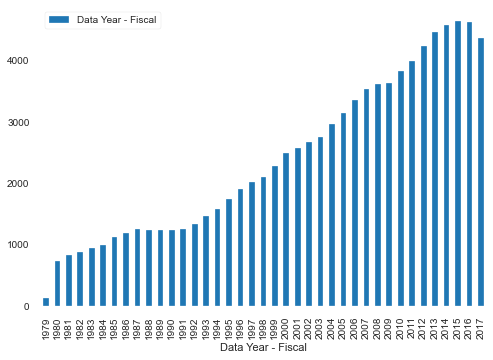

In [6]:
#volume of data increases YoY
df2 = pd.DataFrame(df.groupby('Data Year - Fiscal')['Data Year - Fiscal'].count(), index=None)
df2.index = df2.index.astype(int)
_ = df2.plot.bar()

In [9]:
from sklearn.impute import SimpleImputer 

# creating surrogates

for col in df:
        if df[col].isna().sum() != 0:
            df[col + '_surrogate'] = df[col].isna().astype(int)

#fixing numericals 
imputer = SimpleImputer(missing_values = np.nan, strategy='constant')
fitted=imputer.fit(df.select_dtypes(include=['int64','float64']))
df[df.select_dtypes(include=['int64','float64']).columns] = fitted.transform(df.select_dtypes(include=['int64','float64']))

In [10]:
df['BK'] = df['BK'].astype(int) 

In [11]:
with pd.option_context('display.max_rows', None, 'display.max_columns', None, 'display.float_format', lambda x: '%.1f' % x):
    display(df.head())

,Data Year - Fiscal,Tobin's Q,EPS,Liquidity,Profitability,Productivity,Leverage Ratio,Asset Turnover,Operational Margin,Return on Equity,Market Book Ratio,Assets Growth,Sales Growth,Employee Growth,BK,Tobin's Q_surrogate,EPS_surrogate,Liquidity_surrogate,Profitability_surrogate,Productivity_surrogate,Leverage Ratio_surrogate,Asset Turnover_surrogate,Operational Margin_surrogate,Return on Equity_surrogate,Market Book Ratio_surrogate,Assets Growth_surrogate,Sales Growth_surrogate,Employee Growth_surrogate
0,1979.0,1.0,1.6,0.4,0.2,0.1,1.3,1.8,0.1,0.1,2.2,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,1,1,1
1,1979.0,1.0,0.9,0.2,0.0,0.0,3.4,2.1,0.0,0.1,1.2,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,1,1,1
2,1979.0,0.8,0.4,0.2,0.2,0.1,1.8,2.4,0.0,0.3,0.3,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,1,1,1
3,1979.0,7.3,0.0,-0.1,-0.1,0.1,0.1,0.2,0.4,0.0,48.3,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,1,1,1
4,1979.0,1.7,0.4,0.5,0.4,0.3,0.1,2.4,0.1,0.1,4.4,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,1,1,1


In [295]:
#checking distribution in target feature.Highly imbalanced dataset!!!
df['BK'].value_counts()/len(df)

0    0.993992
1    0.006008
Name: BK, dtype: float64

In [13]:
df.shape

(92872, 15)

In [296]:
df.describe()

,Data Year - Fiscal,Tobin's Q,EPS,Liquidity,Profitability,Productivity,Leverage Ratio,Asset Turnover,Operational Margin,Return on Equity,...,Profitability_surrogate,Productivity_surrogate,Leverage Ratio_surrogate,Asset Turnover_surrogate,Operational Margin_surrogate,Return on Equity_surrogate,Market Book Ratio_surrogate,Assets Growth_surrogate,Sales Growth_surrogate,Employee Growth_surrogate
count,92872.000000,92872.000000,92872.000000,92872.000000,92872.000000,92872.000000,92872.000000,92872.000000,92872.000000,92872.000000,...,92872.000000,92872.000000,92872.00000,92872.000000,92872.000000,92872.000000,92872.000000,92872.000000,92872.000000,92872.000000
mean,2004.105888,25.300171,-14.460577,-2.624239,-29.458717,-1.219618,1.344940,1.050811,-7.441862,-2.112200,...,0.002660,0.002660,0.00028,0.002660,0.059835,0.000086,0.000614,0.072153,0.072153,0.075480
std,9.875926,901.594073,2195.408189,121.449170,676.331196,35.837859,253.002671,2.113826,207.953408,352.581716,...,0.051503,0.051503,0.01673,0.051503,0.237182,0.009281,0.024766,0.258743,0.258743,0.264166
min,1979.000000,0.000000,-384000.000000,-25968.520000,-79682.000000,-5093.000000,-7811.000000,-31.590000,-30175.700000,-88875.140000,...,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1998.000000,1.120000,-0.140000,0.020000,-0.630000,-0.060000,0.000000,0.380000,-0.020000,-0.080000,...,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,2006.000000,1.540000,0.330000,0.190000,0.070000,0.060000,0.280000,0.820000,0.060000,0.030000,...,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,2012.000000,2.580000,1.530000,0.400000,0.310000,0.110000,0.820000,1.380000,0.130000,0.070000,...,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,2017.000000,194537.670000,55339.000000,1.000000,140.580000,1102.000000,75970.380000,276.380000,394.470000,39500.000000,...,1.000000,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [189]:
with pd.option_context('display.max_rows', None, 'display.max_columns', None, 'display.float_format', lambda x: '%.1f' % x):
    df.groupby(['Data Year - Fiscal'])['BK'].value_counts()

Data Year - Fiscal  BK
1979                0      131
1980                0      731
                    1        2
1981                0      812
                    1       15
1982                0      860
                    1       12
1983                0      921
                    1       16
1984                0      968
                    1       25
1985                0     1100
                    1       28
1986                0     1170
                    1       22
1987                0     1230
                    1       29
1988                0     1201
                    1       28
1989                0     1194
                    1       38
1990                0     1184
                    1       45
1991                0     1220
                    1       28
1992                0     1312
                    1       24
1993                0     1451
                    1       16
1994                0     1564
                    1       10
1995            

In [12]:
#EDA of features
prof = ProfileReport(df,minimal=False) 
prof.to_notebook_iframe()

FeatureCorrelation(ax=<matplotlib.axes._subplots.AxesSubplot object at 0x000001CDE2A40190>,
                   method='mutual_info-classification', sort=True)

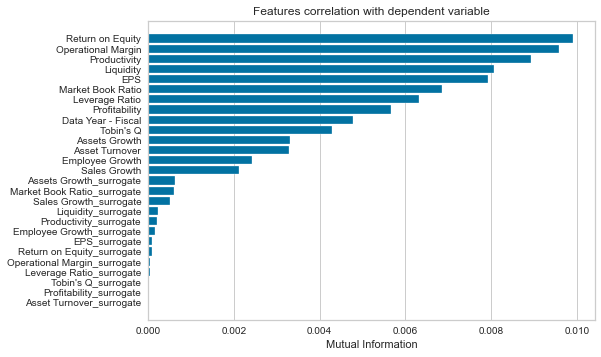

In [13]:
#looking at feature correlation with target feature after removing NaN
df_nona=df.dropna()
from yellowbrick.target import FeatureCorrelation

visualizer = FeatureCorrelation(method='mutual_info-classification', sort=True)
visualizer.fit(df.loc[:, df.columns != 'BK'], df["BK"], random_state=0)
visualizer.poof()

In [14]:
#Calculating Altman's score
df['altman_score']=1.2*df['Liquidity']+1.4*df['Profitability']+3.3*df['Productivity']+0.6*df['Leverage Ratio']+1.0*df['Asset Turnover']

In [327]:
df.head()

,Data Year - Fiscal,Tobin's Q,EPS,Liquidity,Profitability,Productivity,Leverage Ratio,Asset Turnover,Operational Margin,Return on Equity,...,Leverage Ratio_surrogate,Asset Turnover_surrogate,Operational Margin_surrogate,Return on Equity_surrogate,Market Book Ratio_surrogate,Assets Growth_surrogate,Sales Growth_surrogate,Employee Growth_surrogate,altman_score_desc,altman_score
0,1979.0,0.980,1.580,0.360,0.180,0.130,1.330,1.770,0.070,0.150,...,0,0,0,0,0,1,1,1,Safe,3.6810
1,1979.0,1.610,1.730,0.200,0.240,0.160,0.870,1.740,0.090,0.100,...,0,0,0,0,0,1,1,1,Safe,3.3660
2,1979.0,16.050,-0.050,0.620,-0.080,-0.150,0.390,0.250,-0.600,-0.010,...,0,0,0,0,0,1,1,1,High Risk Default,0.6210
3,1979.0,1.000,3.160,0.210,0.190,0.090,0.640,2.430,0.040,0.180,...,0,0,0,0,0,1,1,1,Safe,3.6290
4,1979.0,2.504,0.872,0.277,0.139,0.106,0.308,0.796,0.133,0.032,...,0,0,0,0,0,1,1,1,Gray Area,1.8576


In [15]:
def altman_score(row):
    if row<1.81:
        return 'High Risk Default'
    elif row<2.99:
        return 'Gray Area'
    else:
        return 'Safe'
df['altman_score_desc']=df['altman_score'].apply(altman_score)
df.drop(['altman_score'],inplace=True,axis=1)

In [16]:
with pd.option_context('display.max_rows', None, 'display.max_columns', None, 'display.float_format', lambda x: '%.1f' % x):
    df['altman_score_desc'].value_counts()

High Risk Default    46558
Gray Area            26975
Safe                 19339
Name: altman_score_desc, dtype: int64

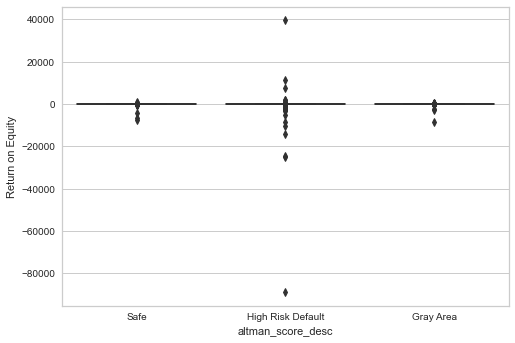

In [17]:
import seaborn as sns
sns.boxplot(x='altman_score_desc',y='Return on Equity',data=df)

In [18]:
from pycaret.classification import *

In [19]:
from imblearn.under_sampling import RandomUnderSampler
from imblearn.over_sampling import RandomOverSampler
exp_clf102=setup(data=df,target="BK",session_id=42,
                train_size=0.8039, #data up to 2014 goes in train
                normalize=True,
                transformation=True,
                ignore_features=["Data Year - Fiscal"],
                ignore_low_variance=True,          
                remove_multicollinearity=True,multicollinearity_threshold=0.95,
                fix_imbalance = True, 
                fix_imbalance_method=RandomUnderSampler(sampling_strategy="majority"),
                data_split_shuffle =False, fold_strategy = 'timeseries',
                 numeric_features=["Tobin's Q_surrogate","EPS_surrogate","Liquidity_surrogate","Profitability_surrogate",
                                 "Productivity_surrogate","Leverage Ratio_surrogate","Asset Turnover_surrogate","Operational Margin_surrogate",
                                 "Return on Equity_surrogate","Market Book Ratio_surrogate","Assets Growth_surrogate","Sales Growth_surrogate",
                                 "Employee Growth_surrogate"])

,Description,Value
0,session_id,42
1,Target,BK
2,Target Type,Binary
3,Label Encoded,None
4,Original Data,"(92872, 29)"
5,Missing Values,False
6,Numeric Features,26
7,Categorical Features,1
8,Ordinal Features,False
9,High Cardinality Features,False


In [20]:
get_config('X_train')

,Tobins Q,EPS,Liquidity,Profitability,Productivity,Leverage Ratio,Asset Turnover,Operational Margin,Return on Equity,Market Book Ratio,Sales Growth,Leverage Ratio_surrogate,Asset Turnover_surrogate,Operational Margin_surrogate,Return on Equity_surrogate,Market Book Ratio_surrogate,Sales Growth_surrogate,altman_score_desc_Gray Area,altman_score_desc_High Risk Default,altman_score_desc_Safe
0,-0.606586,0.000532,0.408268,0.253833,0.217075,0.008877,1.016415,0.111946,0.003193,-0.020264,-0.185198,-0.018302,-0.052086,-0.230901,-0.008184,-0.025364,3.397265,0.0,0.0,1.0
1,-0.598301,-0.000082,-0.009127,0.234949,0.145727,0.026662,1.223888,0.107636,0.003085,-0.020334,-0.185198,-0.018302,-0.052086,-0.230901,-0.008184,-0.025364,3.397265,0.0,0.0,1.0
2,-0.689236,-0.000574,-0.085012,0.254967,0.180166,0.013369,1.460972,0.108961,0.003581,-0.020400,-0.185198,-0.018302,-0.052086,-0.230901,-0.008184,-0.025364,3.397265,0.0,0.0,1.0
3,1.685296,-0.000987,-0.651201,0.208075,0.161015,-0.001569,-1.342541,0.135608,0.002753,-0.017001,-0.185198,-0.018302,-0.052086,-0.230901,-0.008184,-0.025364,3.397265,0.0,1.0,0.0
4,-0.287241,-0.000614,0.772937,0.288624,0.333582,-0.001999,1.440291,0.115843,0.003088,-0.020106,-0.185198,-0.018302,-0.052086,-0.230901,-0.008184,-0.025364,3.397265,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
74654,-0.434124,-0.000892,-0.173942,0.211327,0.155659,0.003883,-0.482649,0.113604,0.002759,0.028856,-0.192435,-0.018302,-0.052086,-0.230901,-0.008184,-0.025364,-0.294354,0.0,1.0,0.0
74655,-0.438831,0.003099,-0.053333,0.341176,0.209370,0.004322,0.599444,0.113604,0.002976,0.006248,-0.198638,-0.018302,-0.052086,-0.230901,-0.008184,-0.025364,-0.294354,0.0,0.0,1.0
74656,-0.587125,0.000610,-0.337493,0.273771,0.102332,-0.000499,-0.409356,0.102833,0.002852,-0.014232,-0.309854,-0.018302,-0.052086,-0.230901,-0.008184,-0.025364,-0.294354,0.0,1.0,0.0
74657,2.456199,-0.001263,-3.085968,-2.172570,-2.949356,-0.007341,-0.039336,-0.397664,0.000028,-0.038906,-0.185198,-0.018302,-0.052086,-0.230901,-0.008184,-0.025364,3.397265,0.0,1.0,0.0


In [21]:
best_model=compare_models(sort="AUC") 

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lightgbm,Light Gradient Boosting Machine,0.8239,0.9073,0.8332,0.0304,0.0562,0.0457,0.1212,0.2600
et,Extra Trees Classifier,0.8064,0.8982,0.8555,0.0279,0.0522,0.0414,0.1170,0.3180
catboost,CatBoost Classifier,0.8251,0.8975,0.8190,0.0299,0.0556,0.0450,0.1205,4.2620
gbc,Gradient Boosting Classifier,0.8270,0.8950,0.8185,0.0317,0.0584,0.0480,0.1227,0.2040
rf,Random Forest Classifier,0.8271,0.8915,0.8084,0.0314,0.0580,0.0476,0.1213,0.2810
xgboost,Extreme Gradient Boosting,0.8227,0.8864,0.8004,0.0288,0.0534,0.0428,0.1144,0.4830
ada,Ada Boost Classifier,0.8166,0.8811,0.7970,0.0270,0.0507,0.0398,0.1116,0.1660
knn,K Neighbors Classifier,0.7716,0.8178,0.7490,0.0218,0.0408,0.0298,0.0875,0.4030
nb,Naive Bayes,0.9484,0.8116,0.3319,0.0430,0.0704,0.0613,0.0949,0.0500
lr,Logistic Regression,0.7001,0.7924,0.7263,0.0187,0.0353,0.0240,0.0734,0.3370


In [22]:
rf=create_model("rf")
rf_tuned=tune_model(rf,optimize="AUC")

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.7718,0.9173,0.9314,0.0959,0.1739,0.1333,0.2557
1,0.8541,0.9209,0.8500,0.0650,0.1208,0.1011,0.2105
2,0.8522,0.9157,0.8088,0.0526,0.0988,0.0816,0.1825
3,0.7287,0.8174,0.7647,0.0070,0.0139,0.0090,0.0554
4,0.7722,0.8643,0.8000,0.0052,0.0102,0.0073,0.0523
5,0.8319,0.9108,0.7778,0.0061,0.0121,0.0095,0.0592
6,0.7830,0.9207,0.9643,0.0180,0.0354,0.0275,0.1153
7,0.7861,0.9519,1.0000,0.0102,0.0202,0.0159,0.0896
8,0.8372,0.8745,0.6923,0.0081,0.0160,0.0123,0.0626
9,0.8126,0.9215,0.9286,0.0101,0.0200,0.0160,0.0858


In [23]:
evaluate_model(rf_tuned)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

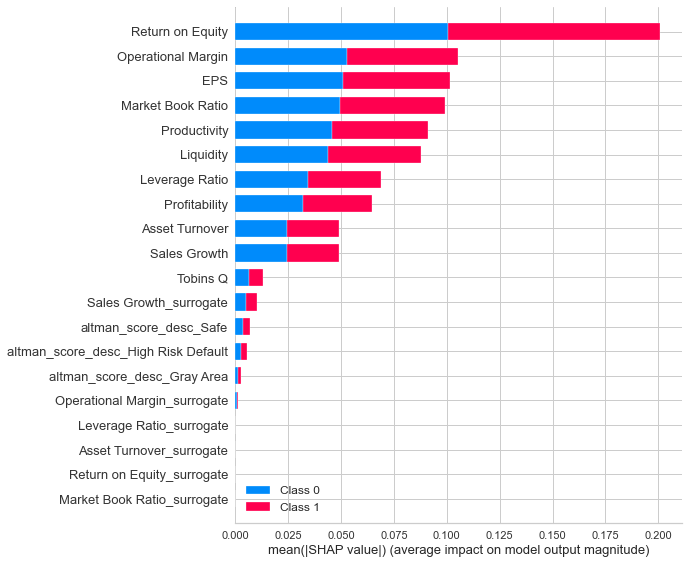

In [24]:
interpret_model(rf_tuned)

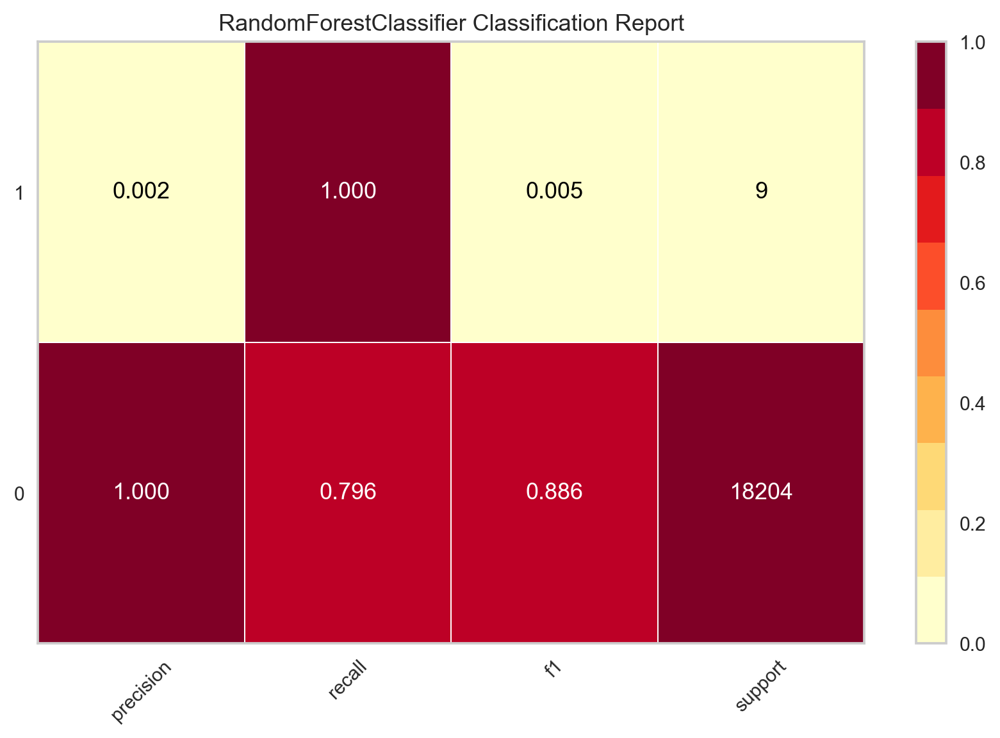

In [25]:
plot_model(rf_tuned, plot='class_report', scale = 3)

In [26]:
rf_tuned.get_params()

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'class_weight': {},
 'criterion': 'gini',
 'max_depth': 9,
 'max_features': 'sqrt',
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0,
 'min_impurity_split': None,
 'min_samples_leaf': 6,
 'min_samples_split': 5,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 120,
 'n_jobs': -1,
 'oob_score': False,
 'random_state': 42,
 'verbose': 0,
 'warm_start': False}

In [27]:
bagged_rf=ensemble_model(rf)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.7852,0.9191,0.9314,0.1013,0.1827,0.1429,0.2656
1,0.8733,0.9178,0.8000,0.0705,0.1296,0.1103,0.2137
2,0.8475,0.9139,0.7794,0.0494,0.0929,0.0755,0.1713
3,0.7302,0.8141,0.7647,0.0071,0.0140,0.0091,0.0556
4,0.7964,0.8755,0.8000,0.0058,0.0114,0.0085,0.0567
5,0.8309,0.9051,0.7778,0.0061,0.0120,0.0094,0.0590
6,0.7768,0.9220,0.9286,0.0169,0.0332,0.0253,0.1079
7,0.8279,0.9641,1.0000,0.0127,0.0250,0.0208,0.1024
8,0.8313,0.8934,0.7692,0.0087,0.0172,0.0134,0.0700
9,0.8189,0.9385,0.9286,0.0105,0.0207,0.0167,0.0877


In [28]:
boosted_rf=ensemble_model(rf,method="Boosting")

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.8278,0.9253,0.8857,0.1189,0.2096,0.1720,0.2864
1,0.8687,0.9202,0.8250,0.0700,0.1290,0.1097,0.2166
2,0.8456,0.9176,0.8088,0.0505,0.0950,0.0776,0.1776
3,0.7492,0.8298,0.8235,0.0082,0.0162,0.0113,0.0659
4,0.7847,0.8869,0.8000,0.0055,0.0108,0.0079,0.0545
5,0.8348,0.9045,0.8889,0.0071,0.0141,0.0115,0.0707
6,0.7759,0.9128,0.9643,0.0175,0.0343,0.0264,0.1130
7,0.8531,0.9451,0.8667,0.0129,0.0254,0.0212,0.0950
8,0.8223,0.8477,0.6923,0.0074,0.0147,0.0110,0.0588
9,0.8023,0.8948,0.8571,0.0089,0.0176,0.0135,0.0749


In [29]:
param_grid={"min_samples_leaf":[1,3,5,10],
            "max_depth":[10,15,20,25,30],
             "max_features":[1,5,15,20,17],
            "n_estimators":[100,200,300,350,400],
             "criterion":["gini","entropy"]}

rf_manual=tune_model(rf,custom_grid=param_grid)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.7953,0.9154,0.9314,0.1058,0.1901,0.1508,0.2737
1,0.8917,0.9190,0.8000,0.0817,0.1483,0.1297,0.2341
2,0.8550,0.9258,0.8235,0.0545,0.1022,0.0850,0.1886
3,0.7311,0.8308,0.7647,0.0071,0.0140,0.0091,0.0558
4,0.8092,0.8733,0.9000,0.0069,0.0137,0.0108,0.0691
5,0.8180,0.9098,0.8889,0.0064,0.0128,0.0102,0.0665
6,0.7953,0.9121,0.8214,0.0163,0.0321,0.0242,0.0975
7,0.8353,0.9388,0.8667,0.0115,0.0227,0.0184,0.0885
8,0.8227,0.8571,0.6923,0.0075,0.0147,0.0110,0.0589
9,0.8453,0.9275,0.8571,0.0113,0.0223,0.0183,0.0878


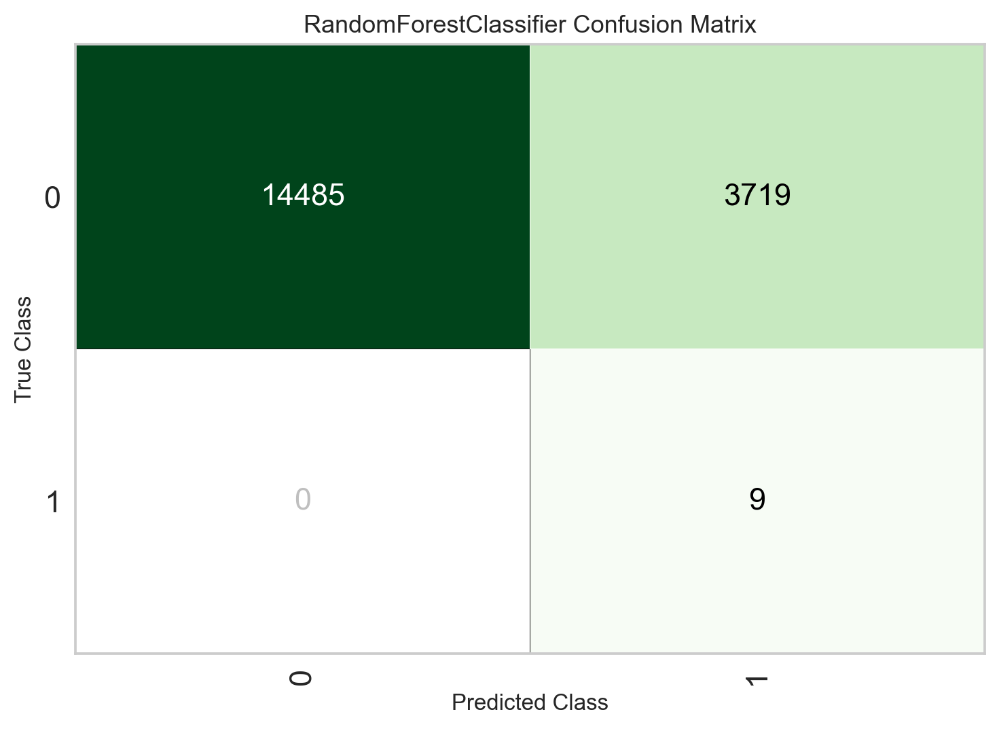

In [30]:
plot_model(rf_tuned, plot='confusion_matrix', scale = 3)

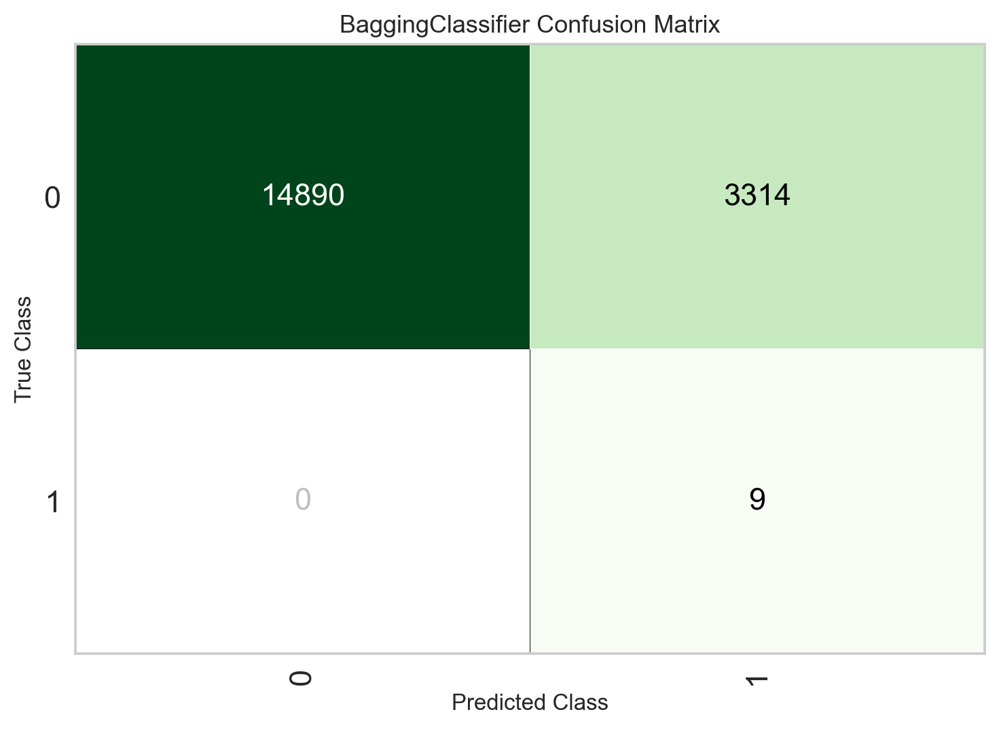

In [32]:
plot_model(bagged_rf,plot='confusion_matrix', scale = 3)

In [33]:
lda=create_model("lda")
lda_tuned=tune_model(lda,optimize="AUC")

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.7289,0.7731,0.6400,0.0593,0.1085,0.0644,0.1313
1,0.7883,0.8419,0.7500,0.0406,0.0771,0.0560,0.1409
2,0.7768,0.7552,0.6324,0.0280,0.0537,0.0352,0.0978
3,0.7360,0.7667,0.7059,0.0067,0.0132,0.0083,0.0500
4,0.7765,0.8333,0.8000,0.0053,0.0104,0.0075,0.0530
5,0.8172,0.7508,0.4444,0.0032,0.0064,0.0038,0.0247
6,0.8009,0.8012,0.5357,0.0111,0.0217,0.0138,0.0542
7,0.7741,0.8793,0.8000,0.0078,0.0154,0.0111,0.0643
8,0.8195,0.7243,0.5385,0.0057,0.0113,0.0075,0.0407
9,0.8068,0.7561,0.6429,0.0068,0.0135,0.0095,0.0517


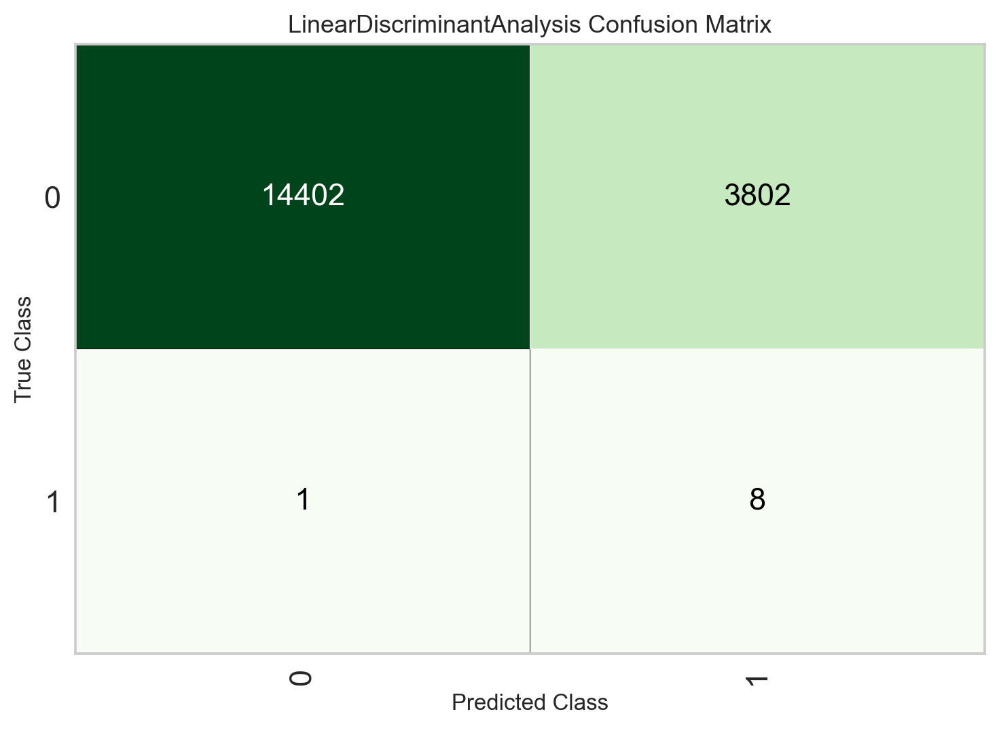

In [34]:
plot_model(lda_tuned,plot='confusion_matrix', scale = 3)

In [35]:
param_grid={"eta0":[0.01,0.05,0.5,0.1],
             "penalty":["l1","l2","elasticnet","none"]}

svm=create_model('svm')
svm_manual=tune_model(svm,custom_grid=param_grid,optimize='AUC')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.7274,0.0000,0.8514,0.0755,0.1387,0.0959,0.2009
1,0.5596,0.0000,0.8625,0.0226,0.0441,0.0217,0.0908
2,0.8522,0.0000,0.6324,0.0421,0.0790,0.0613,0.1356
3,0.8177,0.0000,0.8235,0.0112,0.0221,0.0173,0.0827
4,0.6331,0.0000,0.9000,0.0036,0.0072,0.0043,0.0424
5,0.7175,0.0000,0.2222,0.0010,0.0021,-0.0006,-0.0048
6,0.6235,0.0000,0.8929,0.0097,0.0192,0.0111,0.0681
7,0.8297,0.0000,0.7333,0.0095,0.0187,0.0144,0.0702
8,0.5677,0.0000,0.8462,0.0037,0.0074,0.0036,0.0365
9,0.8144,0.0000,0.5714,0.0063,0.0125,0.0085,0.0450


In [36]:
gbc=create_model('xgboost')
gbc_tuned=tune_model(gbc)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.6885,0.8938,0.9086,0.0704,0.1308,0.0871,0.1989
1,0.8337,0.9186,0.9000,0.0604,0.1131,0.0931,0.2078
2,0.7713,0.8970,0.8676,0.0368,0.0707,0.0524,0.1496
3,0.6621,0.8379,0.8235,0.0061,0.0121,0.0071,0.0512
4,0.7311,0.8699,0.9000,0.0049,0.0098,0.0069,0.0545
5,0.7648,0.8424,0.7778,0.0044,0.0087,0.0061,0.0465
6,0.7336,0.9120,1.0000,0.0153,0.0300,0.0221,0.1057
7,0.7665,0.9517,0.9333,0.0088,0.0174,0.0130,0.0774
8,0.7694,0.8902,0.6923,0.0057,0.0114,0.0076,0.0479
9,0.7696,0.8739,0.8571,0.0076,0.0151,0.0111,0.0674


In [88]:
boosted_gbc=ensemble_model(gbc_tuned,method="Boosting",n_estimators=300)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.8033,0.9259,0.9167,0.1037,0.1863,0.1488,0.2692
1,0.8549,0.9195,0.8485,0.0539,0.1014,0.0848,0.1917
2,0.8795,0.9145,0.7500,0.0727,0.1326,0.1128,0.2090
3,0.8810,0.8477,0.6818,0.0182,0.0355,0.0295,0.0981
4,0.9238,0.8874,0.4000,0.0077,0.0151,0.0123,0.0468
5,0.9667,0.7342,0.1111,0.0045,0.0087,0.0062,0.0162
6,0.9202,0.8744,0.5517,0.0291,0.0554,0.0477,0.1132
7,0.9313,0.9524,0.7000,0.0148,0.0289,0.0261,0.0950
8,0.9665,0.8891,0.4286,0.0264,0.0498,0.0461,0.1000
9,0.9430,0.9241,0.7059,0.0302,0.0580,0.0535,0.1383


In [37]:
tune_model(rf,search_library='scikit-optimize')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.8173,0.9138,0.9029,0.1144,0.2031,0.1649,0.2826
1,0.8942,0.9222,0.7875,0.0825,0.1493,0.1307,0.2332
2,0.8447,0.9250,0.7941,0.0494,0.0929,0.0755,0.1732
3,0.7510,0.8235,0.7647,0.0077,0.0152,0.0102,0.0595
4,0.7968,0.8755,0.7000,0.0051,0.0101,0.0071,0.0473
5,0.8232,0.8955,0.8889,0.0066,0.0132,0.0106,0.0678
6,0.7790,0.9094,0.9286,0.0171,0.0335,0.0256,0.1086
7,0.8182,0.9552,1.0000,0.0120,0.0237,0.0195,0.0991
8,0.7780,0.8584,0.6923,0.0060,0.0118,0.0080,0.0494
9,0.8481,0.9014,0.7857,0.0106,0.0209,0.0169,0.0799


RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='entropy', max_depth=9,
                       max_features=0.5944359893706243, max_leaf_nodes=None,
                       max_samples=None,
                       min_impurity_decrease=2.7849535026226546e-09,
                       min_impurity_split=None, min_samples_leaf=4,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       n_estimators=122, n_jobs=-1, oob_score=False,
                       random_state=42, verbose=0, warm_start=False)

In [38]:
c_space=np.logspace(-5,1,2,8,10)
param_grid={"C":c_space,
           "max_iter":[25,50,100,200,300,400],
           "penalty":["l1","l2","elasticnet","none"],
           "solver":["newton-cg","lbfgs","liblinear","sag","saga"]}
lr=create_model('lr')
lr_manual=tune_model(lr,custom_grid=param_grid,optimize='AUC')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.7414,0.8046,0.6857,0.0659,0.1203,0.0769,0.1533
1,0.7492,0.8602,0.7875,0.0360,0.0689,0.0475,0.1324
2,0.7404,0.7831,0.7206,0.0273,0.0527,0.0340,0.1042
3,0.6474,0.7826,0.7059,0.0050,0.0099,0.0050,0.0369
4,0.6807,0.7976,0.8000,0.0037,0.0073,0.0044,0.0395
5,0.6845,0.6744,0.6667,0.0028,0.0056,0.0029,0.0275
6,0.6589,0.7976,0.7500,0.0090,0.0178,0.0097,0.0552
7,0.6433,0.8928,0.8667,0.0053,0.0106,0.0063,0.0499
8,0.6860,0.7380,0.7692,0.0047,0.0093,0.0055,0.0428
9,0.6530,0.7949,0.8571,0.0051,0.0101,0.0060,0.0485


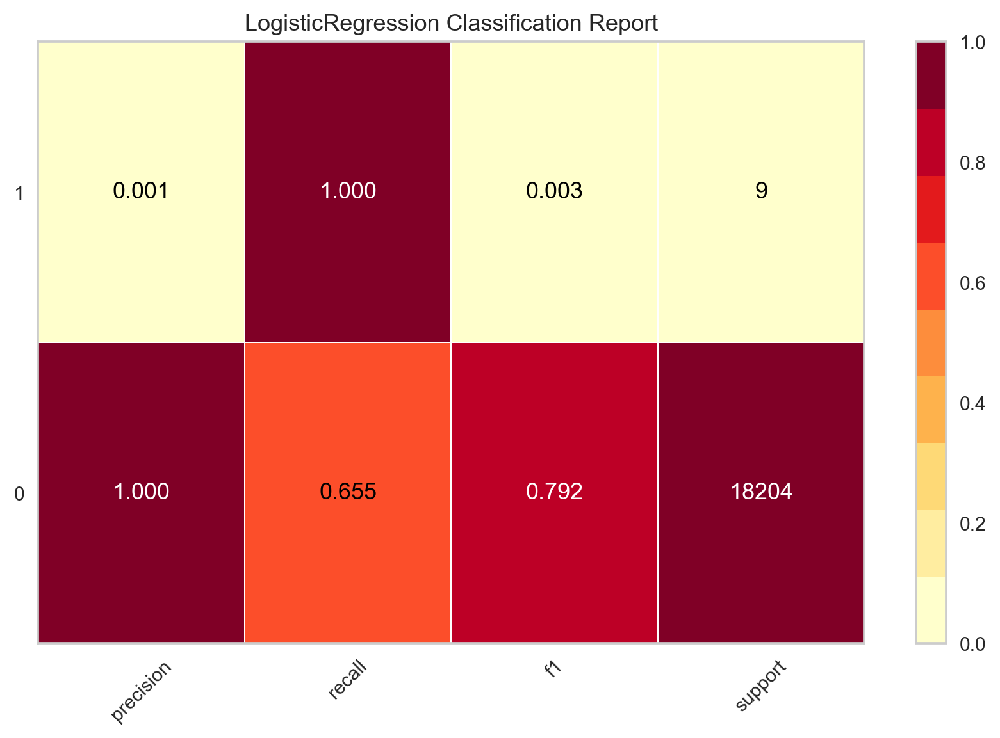

In [39]:
plot_model(lr_manual, plot='class_report', scale = 3)

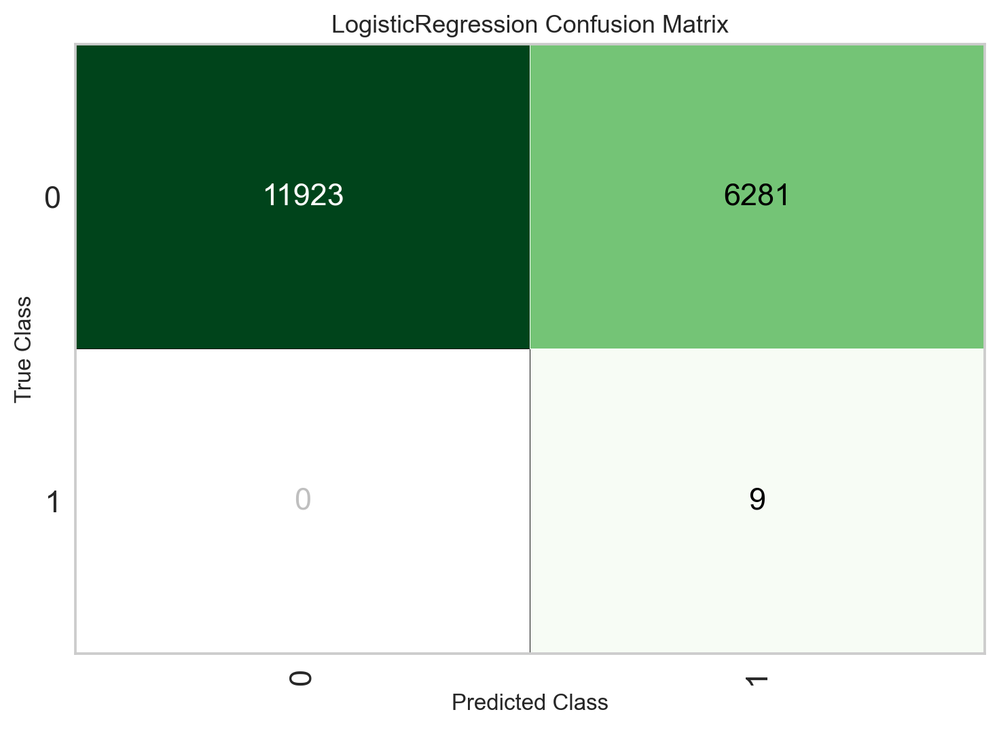

In [40]:
plot_model(lr_manual, plot='confusion_matrix', scale = 3)

In [41]:
y_pred=predict_model(rf_tuned)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Random Forest Classifier,0.7958,0.9436,1.0000,0.0024,0.0048,0.0038,0.0438


In [42]:
y_pred_bagged=predict_model(bagged_rf)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Random Forest Classifier,0.8180,0.9485,1.0000,0.0027,0.0054,0.0044,0.0471


In [43]:
y_pred_lr=predict_model(lr_manual)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Logistic Regression,0.6551,0.9254,1.0000,0.0014,0.0029,0.0019,0.0306


In [44]:
y_pred

,Tobins Q,EPS,Liquidity,Profitability,Productivity,Leverage Ratio,Asset Turnover,Operational Margin,Return on Equity,Market Book Ratio,...,Operational Margin_surrogate,Return on Equity_surrogate,Market Book Ratio_surrogate,Sales Growth_surrogate,altman_score_desc_Gray Area,altman_score_desc_High Risk Default,altman_score_desc_Safe,BK,Label,Score
0,-0.524405,-0.002004,0.381445,0.259521,0.117531,-0.002692,2.042918,0.106145,0.002480,-0.016821,...,-0.230901,-0.008184,-0.025364,-0.294354,0.0,0.0,1.0,0,0,0.6498
1,0.389041,0.001391,0.915941,0.345506,0.247967,-0.001288,-0.320385,0.127711,0.002883,0.019653,...,-0.230901,-0.008184,-0.025364,-0.294354,0.0,0.0,1.0,0,0,0.9850
2,2.601123,-0.001624,-2.322819,-5.109909,-2.617712,-0.009009,-0.337945,-0.445325,-0.000468,-0.023747,...,-0.230901,-0.008184,-0.025364,-0.294354,0.0,1.0,0.0,0,1,0.8214
3,0.043825,-0.000931,-1.164022,-0.716952,0.201672,0.015968,1.208881,0.110287,0.002821,-0.015659,...,-0.230901,-0.008184,-0.025364,-0.294354,0.0,1.0,0.0,0,0,0.5123
4,0.571553,0.001948,1.188485,0.232539,0.240234,0.004147,-0.538867,0.130204,0.002883,0.008014,...,-0.230901,-0.008184,-0.025364,-0.294354,1.0,0.0,0.0,0,0,0.7248
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18208,0.522997,-0.001331,0.020567,-0.255682,-0.136623,0.048800,-0.008401,0.073086,0.002200,0.187018,...,-0.230901,-0.008184,-0.025364,-0.294354,0.0,1.0,0.0,0,1,0.5858
18209,3.803840,-0.014304,-4.632034,-4.269804,-1.644645,-0.003920,0.110974,-0.126209,-0.006672,-0.020684,...,-0.230901,-0.008184,-0.025364,-0.294354,0.0,1.0,0.0,0,1,0.8632
18210,-0.685252,-0.001185,-0.101974,0.214151,0.125139,0.016143,0.125410,0.106973,0.002138,-0.020148,...,-0.230901,-0.008184,-0.025364,-0.294354,1.0,0.0,0.0,0,1,0.7067
18211,0.338123,0.000571,0.516951,0.233960,0.232505,0.015356,0.499314,0.116091,0.002852,0.007144,...,-0.230901,-0.008184,-0.025364,-0.294354,0.0,0.0,1.0,0,0,0.8842


# Final Metrics

**Recall/Sensitivity** = TPR = 1 - Type I Error = TP/(TP + FN)

**Specificity** = TNR = 1 - Type II Error = TN/(TN + FP)

For bankruptcy, there is a preference for higher sensitivity because this translates into losses for lenders, whereas specificity is the threshold for gain.

In [46]:
#TP: (y_true == 1) & (y_pred == 1) 
#TN: (y_true == 0) & (y_pred == 0)
#FP: (y_true == 0) & (y_pred == 1)
#FN: (y_true == 1) & (y_pred == 0)

def specificity(y_true, y_pred):
    TP = 0
    FP = 0
    TN = 0
    FN = 0

    for i in range(len(y_pred)): 
        if y_true[i]==y_pred[i]==1:
            TP += 1
        if y_pred[i]==1 and y_true[i]!=y_pred[i]:
            FP += 1
        if y_true[i]==y_pred[i]==0:
            TN += 1
        if y_pred[i]==0 and y_true[i]!=y_pred[i]:
            FN += 1
    return (TN/(TN+FP))

#balanced accuracy
def bal_acc(y_true, y_pred):
    TP = 0
    FP = 0
    TN = 0
    FN = 0

    for i in range(len(y_pred)): 
        if y_true[i]==y_pred[i]==1:
            TP += 1
        if y_pred[i]==1 and y_true[i]!=y_pred[i]:
            FP += 1
        if y_true[i]==y_pred[i]==0:
            TN += 1
        if y_pred[i]==0 and y_true[i]!=y_pred[i]:
            FN += 1
    return ((TN/(TN+FP)) + (TP/(TP+FN)))/2

In [47]:
from pycaret.utils import check_metric
print('------------------------------------')
print('Bagged Random Forest:')
print('   Accuracy:', check_metric(y_pred_bagged['BK'].astype(int), y_pred_bagged.Label, 'Accuracy'))
print('   Precision:', check_metric(y_pred_bagged['BK'].astype(int), y_pred_bagged.Label, 'Precision'))
print('   Recall:', check_metric(y_pred_bagged['BK'].astype(int), y_pred_bagged.Label, 'Recall'))
print('   Specificity:', specificity(y_pred_bagged['BK'].astype(int), y_pred_bagged.Label))
print('   Balanced Accuracy:', bal_acc(y_pred_bagged['BK'].astype(int), y_pred_bagged.Label))
print('------------------------------------')
print('Logistic Regression:')
print('   Accuracy:', check_metric(y_pred_lr['BK'].astype(int), y_pred_lr.Label, 'Accuracy'))
print('   Precision:', check_metric(y_pred_lr['BK'].astype(int), y_pred_lr.Label, 'Precision'))
print('   Recall:', check_metric(y_pred_lr['BK'].astype(int), y_pred_lr.Label, 'Recall'))
print('   Specificity:', specificity(y_pred_lr['BK'].astype(int), y_pred_lr.Label))
print('   Balanced Accuracy:', bal_acc(y_pred_lr['BK'].astype(int), y_pred_lr.Label))


------------------------------------
Bagged Random Forest:
   Accuracy: 0.818
   Precision: 0.0027
   Recall: 1.0
   Specificity: 0.8179520984399034
   Balanced Accuracy: 0.9089760492199517
------------------------------------
Logistic Regression:
   Accuracy: 0.6551
   Precision: 0.0014
   Recall: 1.0
   Specificity: 0.6549659415513074
   Balanced Accuracy: 0.8274829707756537


In [48]:
final_pred=finalize_model(bagged_rf)